##### Pycolmap API: https://github.com/colmap/colmap/tree/main/pycolmap

In [1]:
%load_ext autoreload
%autoreload 2
import tqdm, tqdm.notebook

tqdm.tqdm = tqdm.notebook.tqdm  # notebook-friendly progress bars
from pathlib import Path
import numpy as np

from hloc import (
    extract_features,
    match_features,
    reconstruction,
    visualization,
    pairs_from_exhaustive,
)
from hloc.visualization import plot_images, read_image
from hloc.utils import viz_3d

In [2]:
data_path = '/Rocket_ssd/dataset/data_litevloc/matterport3d/map_free_eval/test/s00000/'
images = Path(data_path)
outputs = Path("outputs_colmap")
!rm -rf $outputs
sfm_pairs = outputs / "pairs-sfm.txt"
loc_pairs = outputs / "pairs-loc.txt"
sfm_dir = outputs / "sfm"
features = outputs / "features.h5"
matches = outputs / "matches.h5"

feature_conf = extract_features.confs["disk"]
# feature_conf['model']['max_keypoints'] = 2048

matcher_conf = match_features.confs["disk+lightglue"]

print('feature_conf: ', feature_conf)
print('matcher_conf: ', matcher_conf)

feature_conf:  {'output': 'feats-disk', 'model': {'name': 'disk', 'max_keypoints': 5000}, 'preprocessing': {'grayscale': False, 'resize_max': 1600}}
matcher_conf:  {'output': 'matches-disk-lightglue', 'model': {'name': 'lightglue', 'features': 'disk'}}


24 mapping images


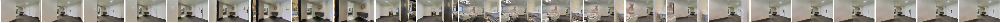

In [3]:
references = [f'seq1/frame_{i:05}.jpg' for i in range(24)]
print(len(references), "mapping images")
plot_images([read_image(images / r) for r in references], dpi=25)

In [4]:
extract_features.main(feature_conf, images, image_list=references, feature_path=features)
pairs_from_exhaustive.main(sfm_pairs, image_list=references)
match_features.main(matcher_conf, sfm_pairs, features=features, matches=matches)

model = reconstruction.main(sfm_dir, images, sfm_pairs, features, matches, image_list=references)
fig = viz_3d.init_figure()
viz_3d.plot_reconstruction(fig, model, color="rgba(255,0,0,0.5)", name="mapping", points_rgb=True)
fig.show()

[2024/11/16 11:27:28 hloc INFO] Extracting local features with configuration:
{'model': {'max_keypoints': 5000, 'name': 'disk'},
 'output': 'feats-disk',
 'preprocessing': {'grayscale': False, 'resize_max': 1600}}
/opt/conda/envs/pose_estimation/lib/python3.8/site-packages/kornia/feature/lightglue.py:44: FutureWarning: `torch.cuda.amp.custom_fwd(args...)` is deprecated. Please use `torch.amp.custom_fwd(args..., device_type='cuda')` instead.
  @torch.cuda.amp.custom_fwd(cast_inputs=torch.float32)


  0%|          | 0/24 [00:00<?, ?it/s]

[2024/11/16 11:27:28 hloc INFO] Finished exporting features.
[2024/11/16 11:27:28 hloc INFO] Found 276 pairs.
[2024/11/16 11:27:28 hloc INFO] Matching local features with configuration:
{'model': {'features': 'disk', 'name': 'lightglue'},
 'output': 'matches-disk-lightglue'}
/opt/conda/envs/pose_estimation/lib/python3.8/site-packages/lightglue/lightglue.py:24: FutureWarning: `torch.cuda.amp.custom_fwd(args...)` is deprecated. Please use `torch.amp.custom_fwd(args..., device_type='cuda')` instead.
  @torch.cuda.amp.custom_fwd(cast_inputs=torch.float32)


  0%|          | 0/276 [00:00<?, ?it/s]

[2024/11/16 11:27:31 hloc INFO] Finished exporting matches.
[2024/11/16 11:27:31 hloc INFO] Creating an empty database...
[2024/11/16 11:27:31 hloc INFO] Importing images into the database...
[2024/11/16 11:27:32 hloc INFO] Importing features into the database...


  0%|          | 0/24 [00:00<?, ?it/s]

[2024/11/16 11:27:32 hloc INFO] Importing matches into the database...


  0%|          | 0/276 [00:00<?, ?it/s]

[2024/11/16 11:27:32 hloc INFO] Performing geometric verification of the matches...
I20241116 11:27:32.151805 112271 misc.cc:198] 
Custom feature matching
I20241116 11:27:32.152767 112271 feature_matching.cc:1021] Matching block [1/1]
I20241116 11:27:32.297082 112271 feature_matching.cc:46]  in 0.144s
I20241116 11:27:32.299795 112271 timer.cc:91] Elapsed time: 0.002 [minutes]
[2024/11/16 11:27:32 hloc INFO] Running 3D reconstruction...
I20241116 11:27:32.306192 112349 misc.cc:198] 
Loading database
I20241116 11:27:32.306504 112349 database_cache.cc:54] Loading cameras...
I20241116 11:27:32.306515 112349 database_cache.cc:64]  24 in 0.000s
I20241116 11:27:32.306519 112349 database_cache.cc:72] Loading matches...
I20241116 11:27:32.307210 112349 database_cache.cc:78]  261 in 0.001s
I20241116 11:27:32.307214 112349 database_cache.cc:94] Loading images...
I20241116 11:27:32.307857 112349 database_cache.cc:143]  24 in 0.001s (connected 24)
I20241116 11:27:32.307861 112349 database_cache.cc:

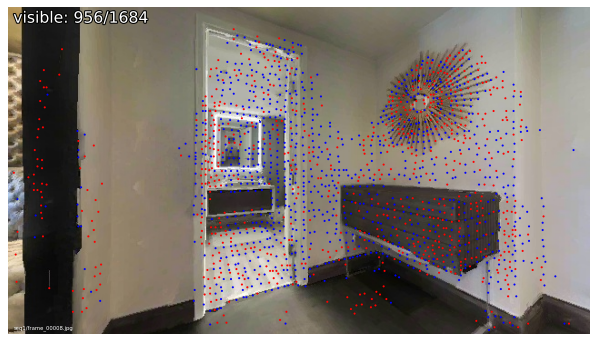

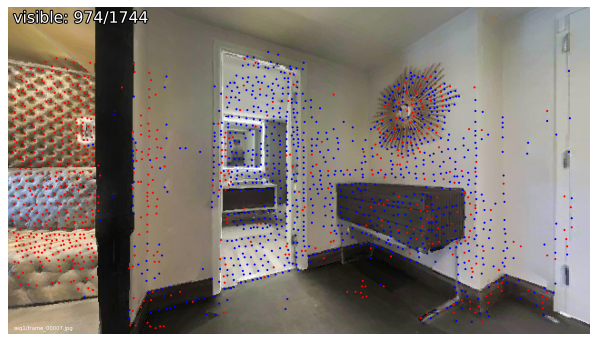

In [19]:
visualization.visualize_sfm_2d(model, images, color_by="visibility", n=2)

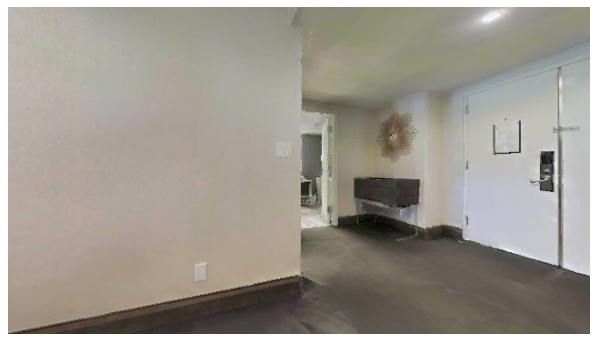

In [6]:
query = 'seq0/frame_00000.jpg'
plot_images([read_image(images / query)], dpi=75)

In [7]:
extract_features.main(feature_conf, images, image_list=[query], feature_path=features, overwrite=True)
pairs_from_exhaustive.main(loc_pairs, image_list=[query], ref_list=references)
match_features.main(matcher_conf, loc_pairs, features=features, matches=matches, overwrite=True)

[2024/11/16 11:34:52 hloc INFO] Extracting local features with configuration:
{'model': {'max_keypoints': 5000, 'name': 'disk'},
 'output': 'feats-disk',
 'preprocessing': {'grayscale': False, 'resize_max': 1600}}


  0%|          | 0/1 [00:00<?, ?it/s]

[2024/11/16 11:34:52 hloc INFO] Finished exporting features.
[2024/11/16 11:34:52 hloc INFO] Found 24 pairs.
[2024/11/16 11:34:52 hloc INFO] Matching local features with configuration:
{'model': {'features': 'disk', 'name': 'lightglue'},
 'output': 'matches-disk-lightglue'}


  0%|          | 0/24 [00:00<?, ?it/s]

[2024/11/16 11:34:52 hloc INFO] Finished exporting matches.


PosixPath('outputs_colmap/matches.h5')

found 751/1655 inlier correspondences.


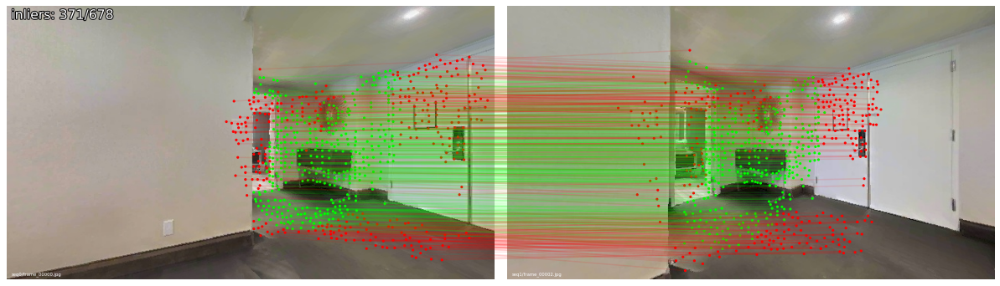

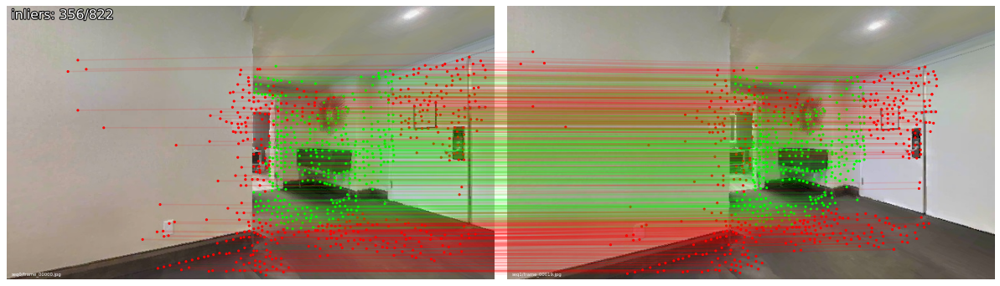

In [33]:
import pycolmap
from hloc.localize_sfm import QueryLocalizer, pose_from_cluster

camera = pycolmap.infer_camera_from_image(images / query)
ref_ids = [model.find_image_with_name(r).image_id for r in references if model.find_image_with_name(r) is not None]
conf = {
    "estimation": {"ransac": {"max_error": 12}},
    "refinement": {"refine_focal_length": True, "refine_extra_params": True},
}
localizer = QueryLocalizer(model, conf)
ret, log = pose_from_cluster(localizer, query, camera, ref_ids, features, matches)

print(f'found {ret["num_inliers"]}/{len(ret["inliers"])} inlier correspondences.')
visualization.visualize_loc_from_log(images, query, log, model)

In [66]:
pose = pycolmap.Image(cam_from_world=ret["cam_from_world"])
viz_3d.plot_camera_colmap(fig, pose, camera, color="rgba(0,255,0,0.5)", name=query, fill=True)
viz_3d.plot_camera_colmap(fig, pycolmap.Image(cam_from_world=pycolmap.Rigid3d()), camera, color="rgba(0,0,255,0.5)", name='world', fill=True)
# visualize 2D-3D correspodences
inl_3d = np.array(
    [model.points3D[pid].xyz for pid in np.array(log["points3D_ids"])[ret["inliers"]]]
)
viz_3d.plot_points(fig, inl_3d, color="lime", ps=1, name=query)
fig.show()

In [67]:
print(f'Query Pose: ', ret['cam_from_world'])
for image_id, image in model.images.items():
    # Pose: from camera to world
    quat = image.cam_from_world.rotation.quat # xyzw
    t = image.cam_from_world.translation # xyz
    print(f'{image_id} {image}: ', t)
# print(model.summary())
# model.write("outputs_colmap")
# model.export_PLY("outputs_colmap/reconstruction.ply")
# print(model)

Query Pose:  Rigid3d(quat_xyzw=[0.00478148, 0.0411895, -0.000449056, 0.99914], t=[0.711768, 0.0313994, -0.385239])
1 Image(image_id=1, camera_id=1, name="seq1/frame_00000.jpg", triangulated=1047/1422):  [ 0.77349108 -0.0044457  -0.22387051]
2 Image(image_id=2, camera_id=2, name="seq1/frame_00001.jpg", triangulated=1134/1447):  [ 0.77282171 -0.01100283 -0.71644932]
3 Image(image_id=3, camera_id=3, name="seq1/frame_00002.jpg", triangulated=1186/1358):  [ 0.78402247 -0.0063015  -1.65362845]
4 Image(image_id=4, camera_id=4, name="seq1/frame_00003.jpg", triangulated=1163/1400):  [ 0.79622582 -0.00323753 -2.58476923]
5 Image(image_id=5, camera_id=5, name="seq1/frame_00004.jpg", triangulated=1161/1423):  [ 0.45342329 -0.00640352 -3.55389639]
6 Image(image_id=6, camera_id=6, name="seq1/frame_00005.jpg", triangulated=1190/1607):  [ 0.32693737 -0.00948562 -4.51256101]
7 Image(image_id=7, camera_id=7, name="seq1/frame_00006.jpg", triangulated=1152/1710):  [ 0.21204254 -0.02873003 -5.42742785]
8 I